Yilin Zhao

yz10381@nyu.edu


In [188]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import itertools


# Problem1

In [189]:
def gaussian_pyramid(img, j, sample_method=cv2.INTER_LINEAR):
    # Gaussian Pyramid
    imgs = []
    for i in range(j):
        resized_img = cv2.resize(img, None, fx=0.5, fy=0.5, interpolation=sample_method)
        imgs.append(resized_img)
        img = resized_img
    return imgs

def laplacian_pyramid(img, j, gaussian_pyramids=None, sample_method=cv2.INTER_LINEAR):
    # Laplacian Pyramid
    if gaussian_pyramids is None:
        gaussian_pyramids = gaussian_pyramid(img, j, sample_method)
    else:
        assert len(gaussian_pyramids) == j
        gaussian_pyramids = gaussian_pyramids
    gaussian_pyramids = [img] + gaussian_pyramids
    imgs = []
    for i in range(j):
        expanded_img = cv2.resize(gaussian_pyramids[i+1], None, fx=2, fy=2, interpolation=sample_method)
        laplacian = gaussian_pyramids[i].astype(int) - expanded_img.astype(int)
        imgs.append(laplacian)
    return imgs

In [190]:
def reconstruct_laplacian(img, laplacian_pyramids, sample_method=cv2.INTER_CUBIC):
    # Reconstruct Laplacian Pyramid
    j = len(laplacian_pyramids)
    for i in range(j):
        img = np.clip(img, 0, 255).astype(np.uint8)
        img = cv2.resize(img, None, fx=2, fy=2, interpolation=sample_method)
        img = img + laplacian_pyramids[j-i-1]
        # if (img.min() < 0) or (img.max() > 255):
        #     print(f"got image with values out of range: {img.min()} ~ {img.max()}")
        #     raise ValueError("")

    return np.clip(img, 0, 255).astype(np.uint8)



def quantize_pyramid(pyramids, q, miu):
    # Quantize Laplacian Pyramid
    def quantize(img):
        img = img.astype(int)
        img = q * np.floor( (img - miu) / q + 0.5 ) + miu
        # img = np.clip(img, -255, 255).astype(int)
        return img
    return list(map(quantize, pyramids))

## Run

In [191]:

def map_int_to_uint8_img(img):
    img = np.clip(img, 0, 255).astype(np.uint8)
    return img

def show_experiment(original_img, gaussian_pyramids, laplacian_pyramids):
    # show the pyramid
    j = len(gaussian_pyramids)
    print(f"gaussian pyramids from {j} to 1")
    plt.figure(figsize=(20, 10))
    plt.subplot(1, j+1, 1)
    plt.imshow(cv2.cvtColor(map_int_to_uint8_img(original_img), cv2.COLOR_BGR2RGB))
    for i in range(j):
        plt.subplot(1, j+1, i+2)
        plt.imshow(cv2.cvtColor(map_int_to_uint8_img(gaussian_pyramids[i]), cv2.COLOR_BGR2RGB))


    plt.show()


    # show the laplacian pyramid
    print(f"laplacian pyramids from 1 to {j}")
    plt.figure(figsize=(20, 10))
    for i in range(j):
        plt.subplot(1, j, i+1)
        im = laplacian_pyramids[i] + 128
        plt.imshow(cv2.cvtColor(map_int_to_uint8_img(im), cv2.COLOR_BGR2RGB), cmap='gray')

    plt.show()

    # reconstruct
    print("reconstructed image")
    reconstructed_img = reconstruct_laplacian(gaussian_pyramids[-1], laplacian_pyramids)
    plt.imshow(cv2.cvtColor(map_int_to_uint8_img(reconstructed_img), cv2.COLOR_BGR2RGB))
    plt.show()

    # differ from the original image
    print("difference from the original image")
    l1_norm_diff = np.sum(np.abs(reconstructed_img - original_img))
    print("l1 norm difference: ", l1_norm_diff)
    plt.imshow(cv2.cvtColor(map_int_to_uint8_img(np.abs(reconstructed_img - original_img)), cv2.COLOR_BGR2RGB))
    plt.show()

## Question (a) (b): Single Run 

original image


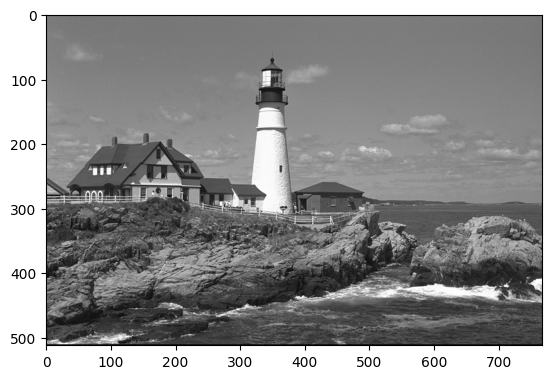

gaussian pyramids from 3 to 1


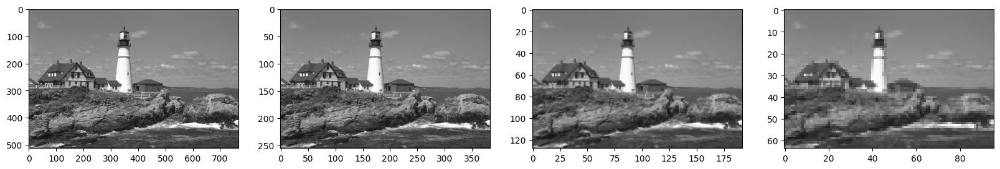

laplacian pyramids from 1 to 3


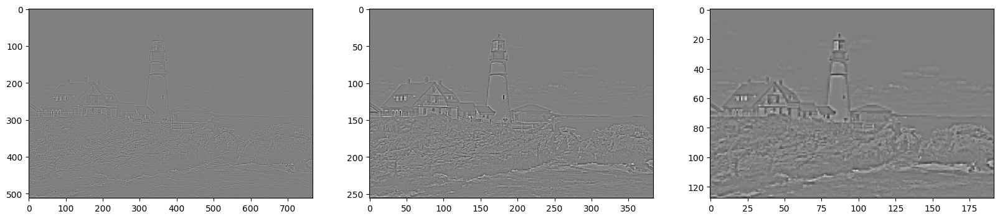

reconstructed image


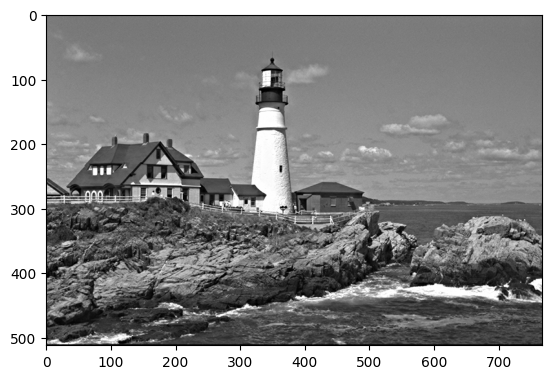

difference from the original image
l1 norm difference:  36909746


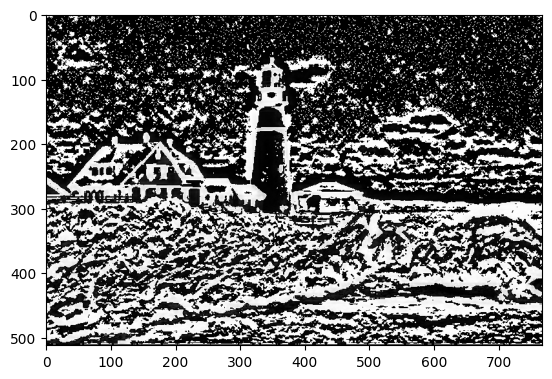

In [192]:
img = cv2.cvtColor(cv2.imread('lighthouse.png'), cv2.COLOR_BGR2GRAY)
j = 3

print("original image")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()
gaussian_pyramids = gaussian_pyramid(img, j)
laplacian_pyramids = laplacian_pyramid(img, j, gaussian_pyramids)
show_experiment(img, gaussian_pyramids, laplacian_pyramids)

## Question (c)

gaussian pyramids from 3 to 1


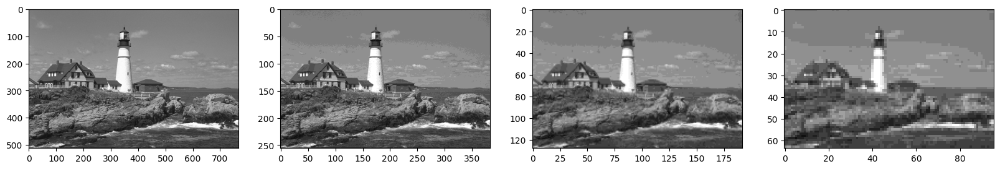

laplacian pyramids from 1 to 3


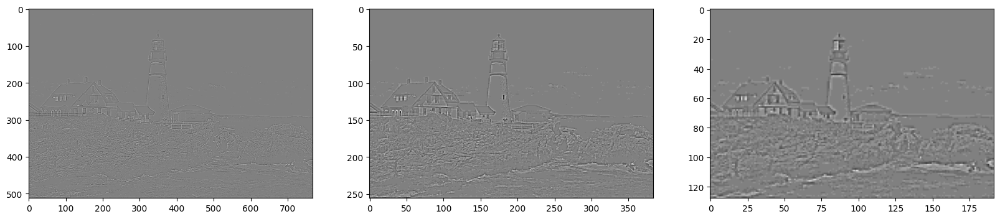

reconstructed image


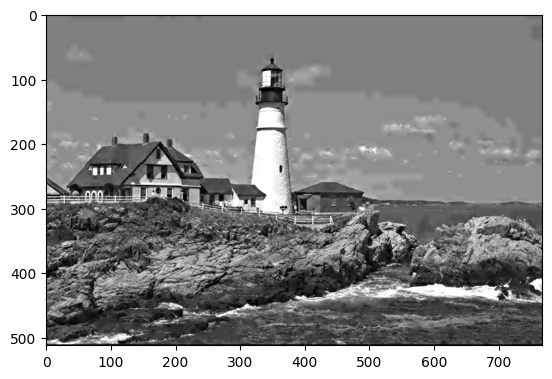

difference from the original image
l1 norm difference:  38237858


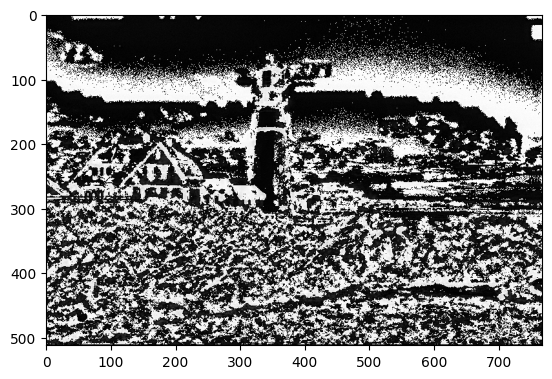

In [193]:
# quantize lapaclian pyramid and gaussian pyramid
# q = 2^4
gaussian_pyramids_quantized = quantize_pyramid(gaussian_pyramids, q=16, miu=128)
laplacian_pyramids_quantized = quantize_pyramid(laplacian_pyramids, q=16, miu=0)
show_experiment(img, gaussian_pyramids_quantized, laplacian_pyramids_quantized)


## Question (d)

In [194]:
original_num_pixels = img.shape[0] * img.shape[1]
print(f'original image size: {img.shape}, original num pixeles: {original_num_pixels}')

original image size: (512, 768), original num pixeles: 393216


j=0, n=0
j=0, n=1
j=0, n=2
j=0, n=3
j=0, n=4
j=0, n=5
j=0, n=6
j=0, n=7
j=0, n=8
j=1, n=0
PSNR: 94.30536564128673, NNZ: 438759, original_num_pixels: 393216, ratio: 1.1158218383789062
-------------------------------------------------
j=1, n=1
PSNR: 93.71683421417076, NNZ: 392646, original_num_pixels: 393216, ratio: 0.9985504150390625
-------------------------------------------------
j=1, n=2
PSNR: 93.11191271642093, NNZ: 316184, original_num_pixels: 393216, ratio: 0.8040974934895834
-------------------------------------------------
j=1, n=3
PSNR: 91.65947517848204, NNZ: 240244, original_num_pixels: 393216, ratio: 0.6109720865885416
-------------------------------------------------
j=1, n=4
PSNR: 88.7527425768788, NNZ: 189149, original_num_pixels: 393216, ratio: 0.48103078206380206
-------------------------------------------------
j=1, n=5
PSNR: 86.10607151213759, NNZ: 142547, original_num_pixels: 393216, ratio: 0.36251576741536456
-------------------------------------------------
j=1, n

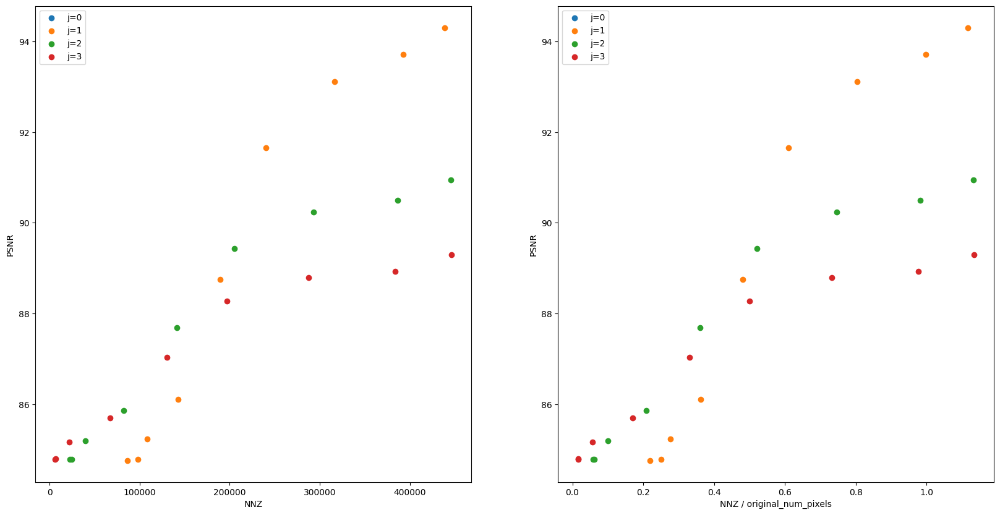

In [195]:
def psnr(img1, img2):
    assert img1.shape == img2.shape
    mse = np.mean((img1 - img2) ** 2) / np.prod(img1.shape)
    if mse == 0:
        print("MSE=0, PSNR is infinite")
        return float('inf')
    psnr = 10 * np.log10(255**2 / mse)
    return psnr

# experiments
js = [0, 1, 2, 3]
ns = list(range(9)) 
results = [] # (j, n, psnr, nnz)
for j, n in itertools.product(js, ns):
    print(f"j={j}, n={n}")
    if j == 0:
        continue
        reconstructed_img = quantize_pyramid([img], q=2**n, miu=128)[0]
        num_non_zero = np.sum(reconstructed_img != 0)
        total_pixels = np.prod(reconstructed_img.shape)
        print(f"PSNR: {psnr(img, reconstructed_img)}, NNZ: {np.sum(reconstructed_img != 0)}, total pixels: {np.prod(reconstructed_img.shape)}, ratio: {np.sum(reconstructed_img != 0) / np.prod(reconstructed_img.shape)}")
        results.append((j, n, psnr(img, reconstructed_img), num_non_zero, num_non_zero/total_pixels))

    gaussian_pyramids = gaussian_pyramid(img, j)
    laplacian_pyramids = laplacian_pyramid(img, j, gaussian_pyramids)
    gaussian_pyramids_quantized = quantize_pyramid(gaussian_pyramids, q=2**n, miu=128)
    laplacian_pyramids_quantized = quantize_pyramid(laplacian_pyramids, q=2**n, miu=0)
    
    num_non_zero = np.sum(gaussian_pyramids_quantized[-1] != 0)
    for i in range(j):
        num_non_zero += np.sum(laplacian_pyramids_quantized[i] != 0)

    reconstructed_img = reconstruct_laplacian(gaussian_pyramids_quantized[-1], laplacian_pyramids_quantized)
    print(f"PSNR: {psnr(img, reconstructed_img)}, NNZ: {num_non_zero}, original_num_pixels: {original_num_pixels}, ratio: {num_non_zero / original_num_pixels}")
    results.append((j, n, psnr(img, reconstructed_img), num_non_zero, num_non_zero/original_num_pixels))
    print("-------------------------------------------------")


# plot the relation between PSNR and NNZ
plt.figure(figsize=(20, 10))
# subplot
plt.subplot(1, 2, 1)
for j in js:
    psnrs = [r[2] for r in results if r[0] == j]
    nnzs = [int(r[3]) for r in results if r[0] == j]
    plt.scatter(nnzs, psnrs, label=f"j={j}")

# set xlabel to display full value and avoid scientific notation
# plt.ticklabel_format(style='plain', axis='x')
plt.xlabel("NNZ")
plt.ylabel("PSNR")
plt.legend()


plt.subplot(1, 2, 2)
for j in js:
    ratios = [r[4] for r in results if r[0] == j]
    psnrs = [r[2] for r in results if r[0] == j]
    plt.scatter(ratios, psnrs, label=f"j={j}")

plt.xlabel("NNZ / original_num_pixels")
plt.ylabel("PSNR")
plt.legend()

plt.show()



### Relationship of PSNR and NNZ
Within each j, we can see that while the number of non-zero increase, the PSNR increases, indicating the MSE is lower. This is expected as we have more information noted for the image when the non-zero numbers are higher.

### Relationship between pyramid depth and representation efficiency for a desired reconstruction PSNR?
For a same PSNR, when the PSNR is low, the deeper level of gaussian pyramid requires less non-zero numbers to represent the original image. While at high PSNR, the deeper level requires more NNZ to achieve the same PSNR.

This is expected as the deeper pyramids offers better PSNR at the price of representation efficiency.

## Question (e)

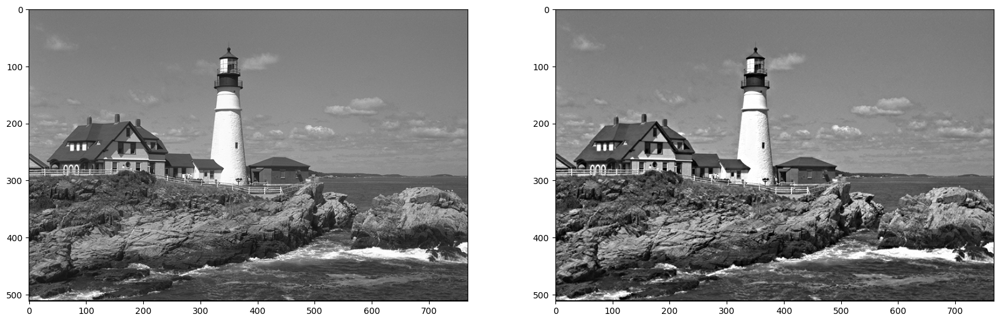

j=3, n=0, PSNR: 89.2950411374612, NNZ: 445899, original_num_pixels: 393216, ratio: 1.1339797973632812


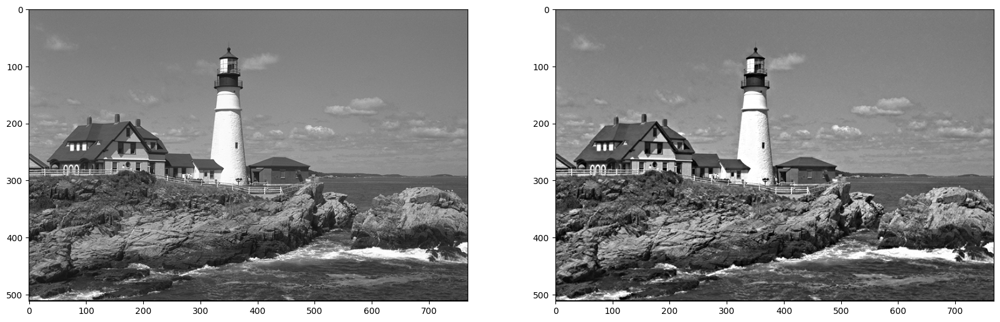

j=3, n=1, PSNR: 89.08746444409489, NNZ: 383993, original_num_pixels: 393216, ratio: 0.9765446980794271


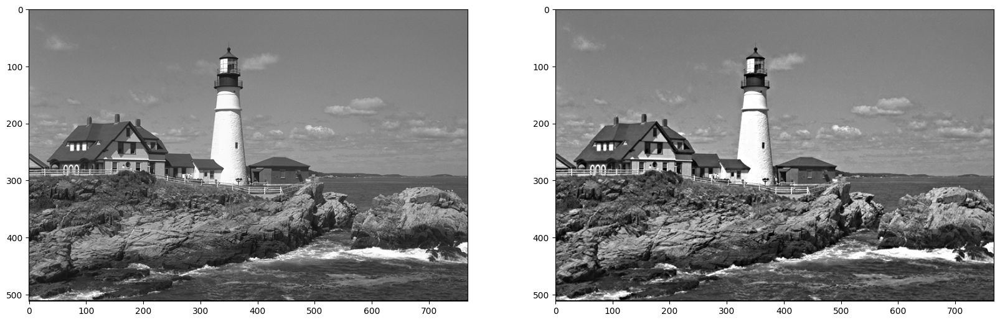

j=3, n=2, PSNR: 88.98983783016034, NNZ: 287913, original_num_pixels: 393216, ratio: 0.7322006225585938


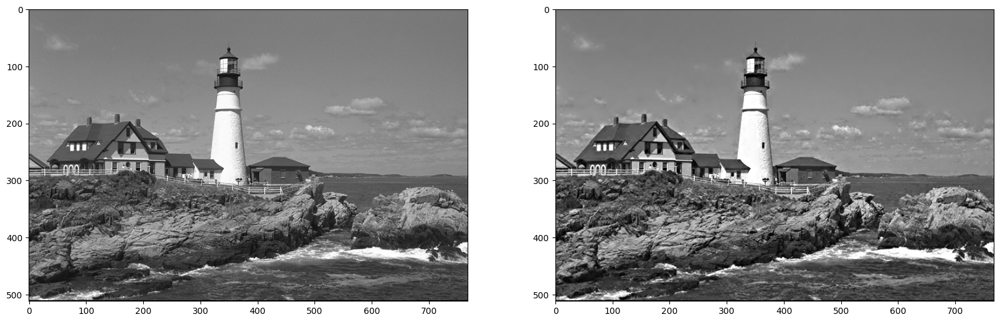

j=3, n=3, PSNR: 88.69219371227835, NNZ: 196898, original_num_pixels: 393216, ratio: 0.5007375081380209


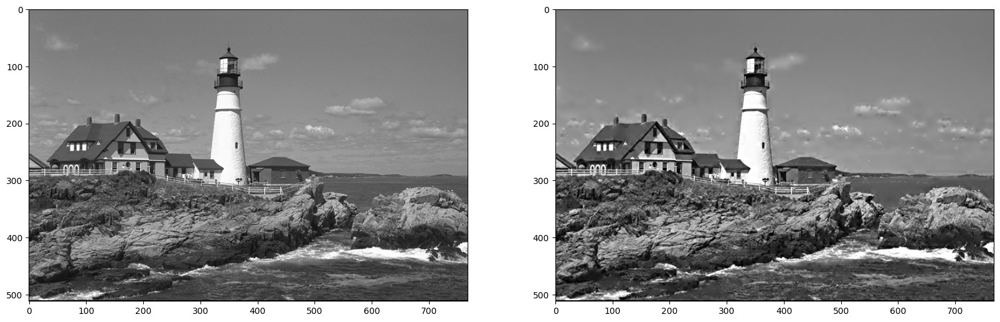

j=3, n=4, PSNR: 88.1440606820815, NNZ: 130311, original_num_pixels: 393216, ratio: 0.33139801025390625


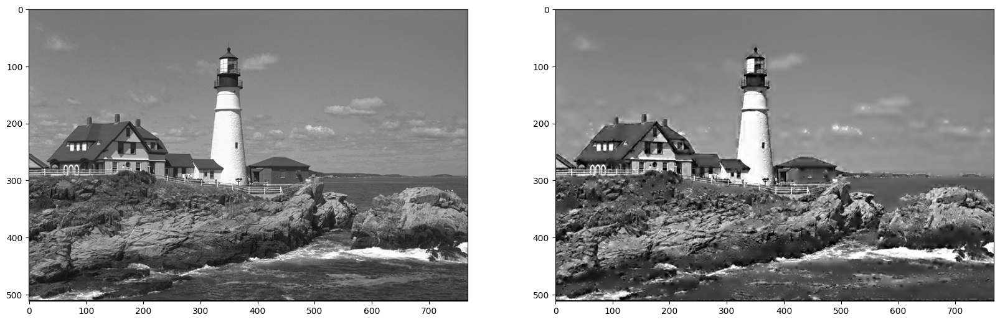

j=3, n=5, PSNR: 87.60590076056637, NNZ: 67056, original_num_pixels: 393216, ratio: 0.1705322265625


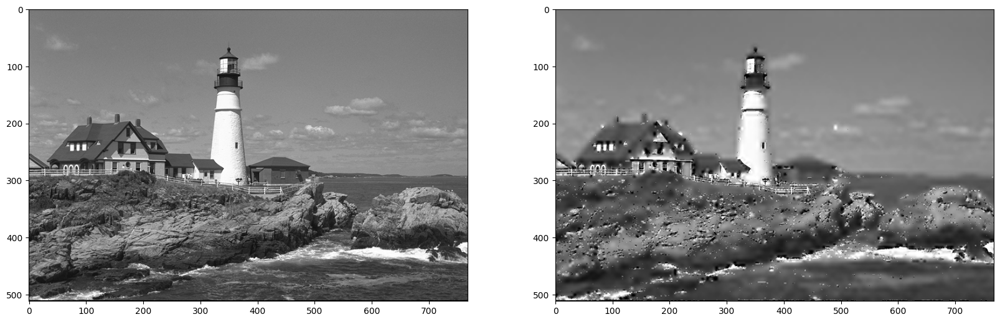

j=3, n=6, PSNR: 87.28052179967031, NNZ: 21999, original_num_pixels: 393216, ratio: 0.05594635009765625


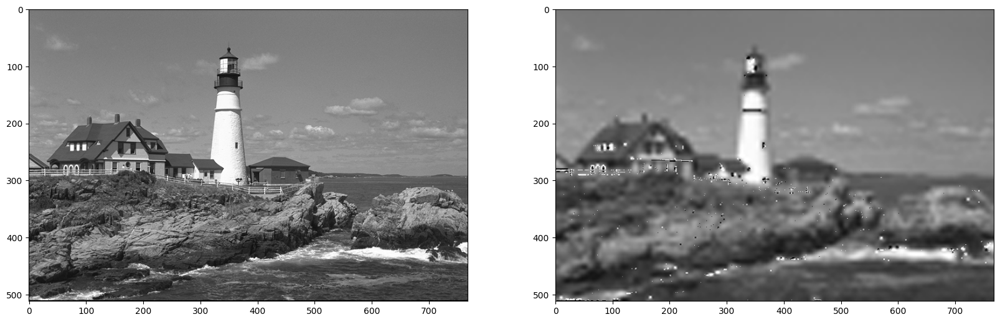

j=3, n=7, PSNR: 87.14190251544179, NNZ: 6715, original_num_pixels: 393216, ratio: 0.017077128092447918


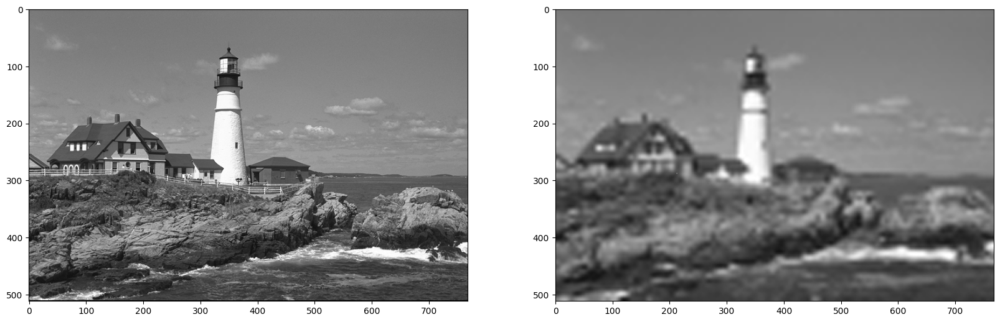

j=3, n=8, PSNR: 87.13123233820896, NNZ: 6145, original_num_pixels: 393216, ratio: 0.015627543131510418


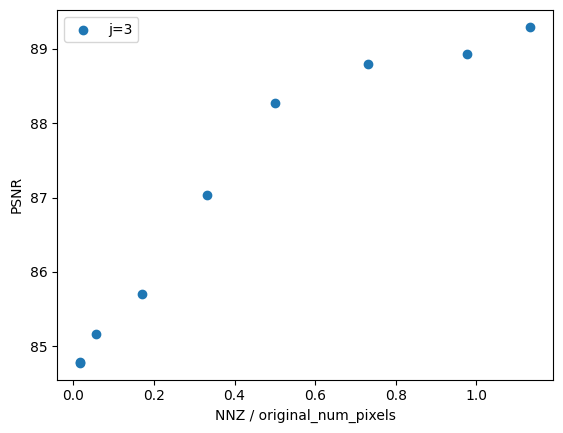

In [196]:
# for j=3
j = 3

for n in range(9):
    gaussian_pyramids = gaussian_pyramid(img, j)
    laplacian_pyramids = laplacian_pyramid(img, j, gaussian_pyramids)
    gaussian_pyramids_quantized = quantize_pyramid(gaussian_pyramids, q=2**n, miu=128)
    laplacian_pyramids_quantized = quantize_pyramid(laplacian_pyramids, q=2**n, miu=0)
    reconstructed_img = reconstruct_laplacian(gaussian_pyramids[-1], laplacian_pyramids_quantized)
    # show original image and the reconstructed image
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(reconstructed_img, cv2.COLOR_BGR2RGB))
    plt.show()
    num_non_zero, total_pixels = 0, 0
    num_non_zero += np.sum(gaussian_pyramids_quantized[-1] != 0)
    for i in range(j):
        num_non_zero += np.sum(laplacian_pyramids_quantized[i] != 0)

    print(f"j={j}, n={n}, PSNR: {psnr(img, reconstructed_img)}, NNZ: {num_non_zero}, original_num_pixels: {original_num_pixels}, ratio: {num_non_zero / original_num_pixels}")



nnzs = [int(r[3]) for r in results if r[0] == j]
psnrs = [r[2] for r in results if r[0] == j]
plt.scatter(ratios, psnrs, label=f"j={j}")

plt.xlabel("NNZ / original_num_pixels")
plt.ylabel("PSNR")
plt.legend()
plt.show()


### Visually Identical Reconstruction 
From my perspective, when n equals to 3 or 4, the reconstructed image is near identical to the original image, except for some artifacts in the background clouds, known as low frequency subparts of the image.

Among the source we are reconstructing the image from (1 gaussian image with lowest resolution and 3 laplacian image), the overall ratio of non-zeros is 0.50 or 0.33.

# Problem2

In [197]:
import pywt


def wavelet_transform(img, j):
    coeffs = []
    for i in range(j):
        coeff = pywt.dwt2(img, 'haar')
        img = coeff[0]
        coeffs.append(coeff)

    return coeffs


def reconstruct_wavelet(coeffs):
    img = coeffs[-1][0]
    for i in reversed(range(len(coeffs))):
        coeff = coeffs[i]
        np.copyto(img, coeff[0])
        img = pywt.idwt2(coeff, 'haar')
    return img

## transform and reconstruct

wavelet subimages at level i=0


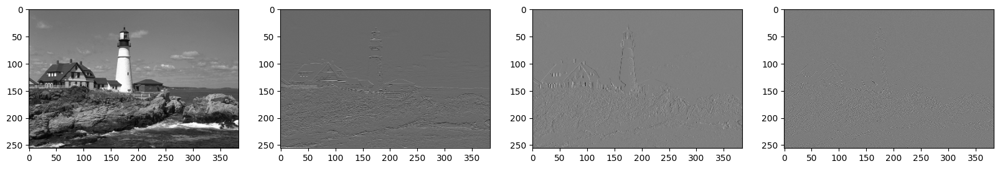

wavelet subimages at level i=1


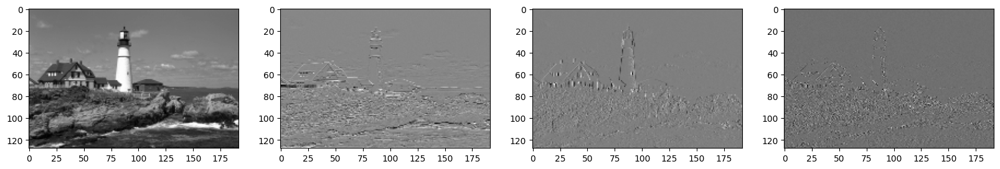

wavelet subimages at level i=2


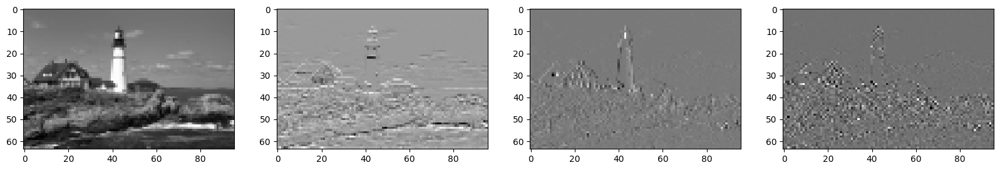

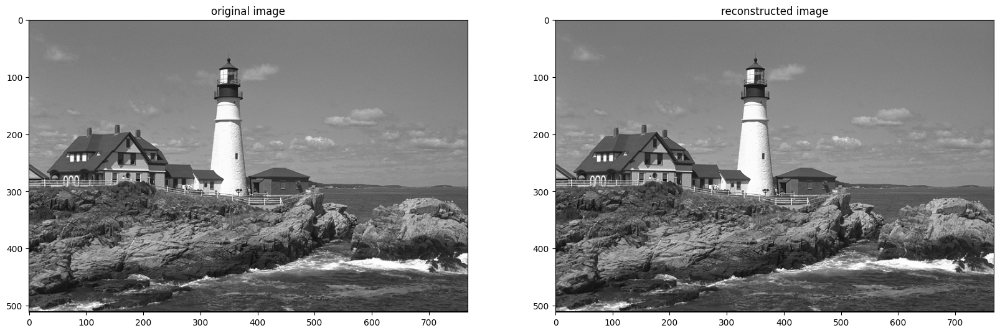

l1 norm difference: 1.1391413146100149e-08
373.01284293090987
NNZ: 375880, total pixels: 393216, ratio: 0.9559122721354166


In [198]:
img = cv2.imread('lighthouse.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
j = 3
n=0

coeffs = wavelet_transform(img, j)

for i in range(j):
    cA, (cH, cV, cD) = coeffs[i]
    print(f"wavelet subimages at level i={i}")
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 4, 1)
    plt.imshow(cA, cmap='gray')
    plt.subplot(1, 4, 2)
    plt.imshow(cH, cmap='gray')
    plt.subplot(1, 4, 3)
    plt.imshow(cV, cmap='gray')
    plt.subplot(1, 4, 4)
    plt.imshow(cD, cmap='gray')
    plt.show()

reconstructed_img = reconstruct_wavelet(coeffs)

# show the original image and the reconstructed image
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title("original image")
plt.imshow(img, cmap='gray')
plt.subplot(1, 2, 2)
plt.imshow(reconstructed_img, cmap='gray')
plt.title("reconstructed image")
plt.show()


print(f"l1 norm difference: {np.sum(np.abs(img - reconstructed_img))}")

print(psnr(img, reconstructed_img))

num_non_zero = 0
total_pixels = 0
cA = coeffs[-1][0]
num_non_zero += np.sum(cA != 0)
total_pixels += np.prod(cA.shape)
for cA, (cH, cV, cD) in coeffs:
    num_non_zero += np.sum(cH != 0)
    num_non_zero += np.sum(cV != 0)
    num_non_zero += np.sum(cD != 0)

    total_pixels += np.prod(cH.shape)
    total_pixels += np.prod(cV.shape)
    total_pixels += np.prod(cD.shape)

print(f"NNZ: {num_non_zero}, total pixels: {total_pixels}, ratio: {num_non_zero / total_pixels}")

## With quantization

wavelet subimages at level i=0


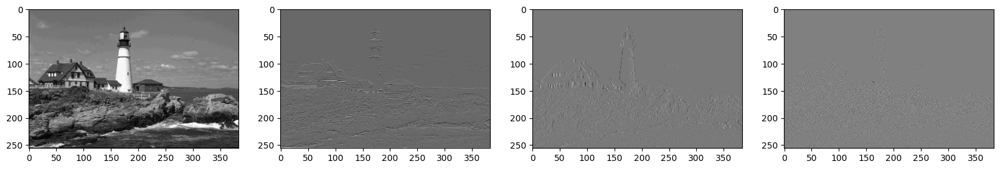

wavelet subimages at level i=1


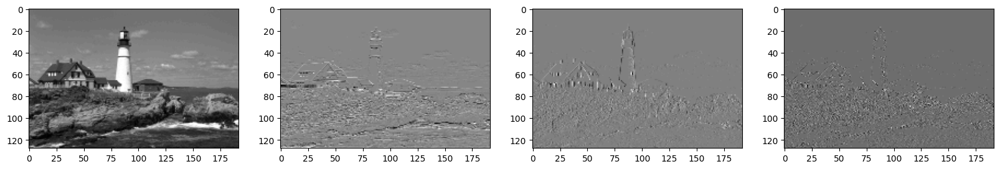

wavelet subimages at level i=2


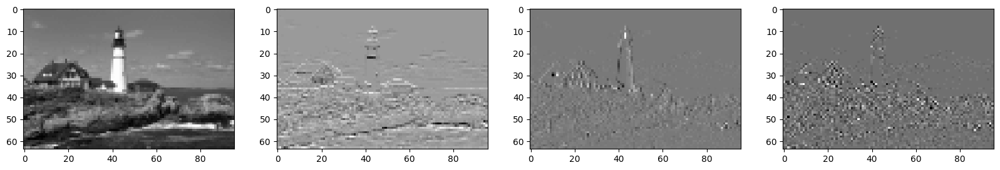

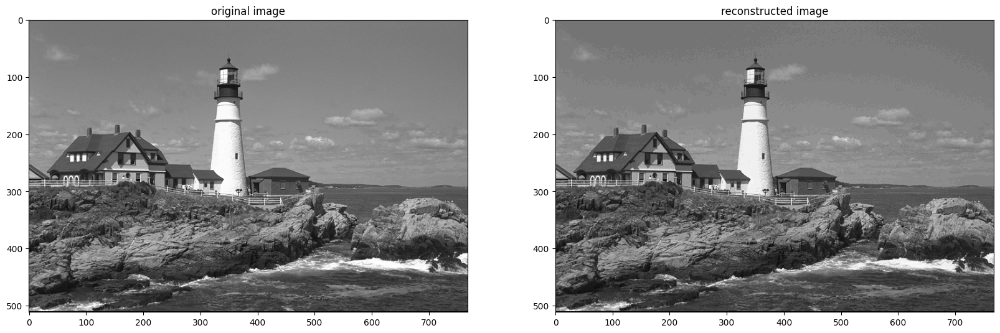

l1 norm difference: 1168995.0000000007
92.60866115955983
NNZ: 99000, original_num_pixels: 393216, ratio: 0.25177001953125


In [199]:
img = cv2.imread('lighthouse.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
j = 3
n=4

coeffs = wavelet_transform(img, j)
for i in reversed(range(j)):
    coeffs[i] = (quantize_pyramid([coeffs[i][0]], q=2**n, miu=0)[0], tuple(quantize_pyramid(coeffs[i][1], q=2**n, miu=0), ))

for i in range(j):
    cA, (cH, cV, cD) = coeffs[i]
    print(f"wavelet subimages at level i={i}")
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 4, 1)
    plt.imshow(cA, cmap='gray')
    plt.subplot(1, 4, 2)
    plt.imshow(cH, cmap='gray')
    plt.subplot(1, 4, 3)
    plt.imshow(cV, cmap='gray')
    plt.subplot(1, 4, 4)
    plt.imshow(cD, cmap='gray')
    plt.show()

reconstructed_img = reconstruct_wavelet(coeffs)

# show the original image and the reconstructed image
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title("original image")
plt.imshow(img, cmap='gray')
plt.subplot(1, 2, 2)
plt.imshow(reconstructed_img, cmap='gray')
plt.title("reconstructed image")
plt.show()


print(f"l1 norm difference: {np.sum(np.abs(img - reconstructed_img))}")

print(psnr(img, reconstructed_img))

num_non_zero = 0
total_pixels = 0
cA = coeffs[-1][0]
num_non_zero += np.sum(cA != 0)
for cA, (cH, cV, cD) in coeffs:
    num_non_zero += np.sum(cH != 0)
    num_non_zero += np.sum(cV != 0)
    num_non_zero += np.sum(cD != 0)

print(f"NNZ: {num_non_zero}, original_num_pixels: {original_num_pixels}, ratio: {num_non_zero / original_num_pixels}")

## Plot the line of psnr to nnz

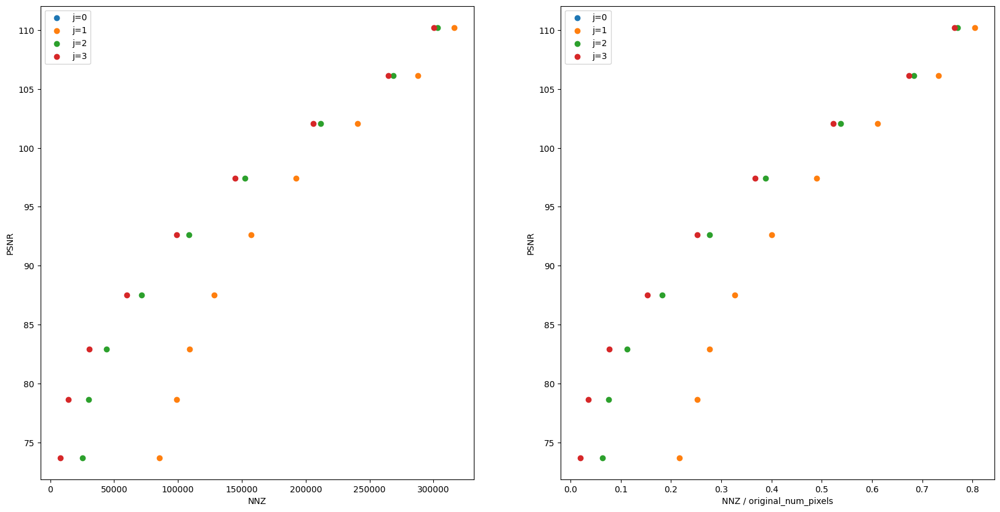

In [200]:
img = cv2.imread('lighthouse.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
results = []
for j, n in itertools.product(range(1, 4), range(9)):
    coeffs = wavelet_transform(img, j)
    for i in reversed(range(j)):
        coeffs[i] = (quantize_pyramid([coeffs[i][0]], q=2**n, miu=0)[0], tuple(quantize_pyramid(coeffs[i][1], q=2**n, miu=0), ))

    reconstructed_img = reconstruct_wavelet(coeffs)

    num_non_zero = 0
    total_pixels = 0
    cA = coeffs[-1][0]
    num_non_zero += np.sum(cA != 0)
    for cA, (cH, cV, cD) in coeffs:
        num_non_zero += np.sum(cH != 0)
        num_non_zero += np.sum(cV != 0)
        num_non_zero += np.sum(cD != 0)   

    results.append((j, n, psnr(img, reconstructed_img), num_non_zero, num_non_zero / original_num_pixels))

# plot the relation between PSNR and NNZ
plt.figure(figsize=(20, 10))
# subplot
plt.subplot(1, 2, 1)
for j in js:
    psnrs = [r[2] for r in results if r[0] == j]
    nnzs = [int(r[3]) for r in results if r[0] == j]
    plt.scatter(nnzs, psnrs, label=f"j={j}")

# set xlabel to display full value and avoid scientific notation
# plt.ticklabel_format(style='plain', axis='x')
plt.xlabel("NNZ")
plt.ylabel("PSNR")
plt.legend()


plt.subplot(1, 2, 2)
for j in js:
    ratios = [r[4] for r in results if r[0] == j]
    psnrs = [r[2] for r in results if r[0] == j]
    plt.scatter(ratios, psnrs, label=f"j={j}")

plt.xlabel("NNZ / original_num_pixels")
plt.ylabel("PSNR")
plt.legend()

plt.show()


## Find the best quantization

n=0


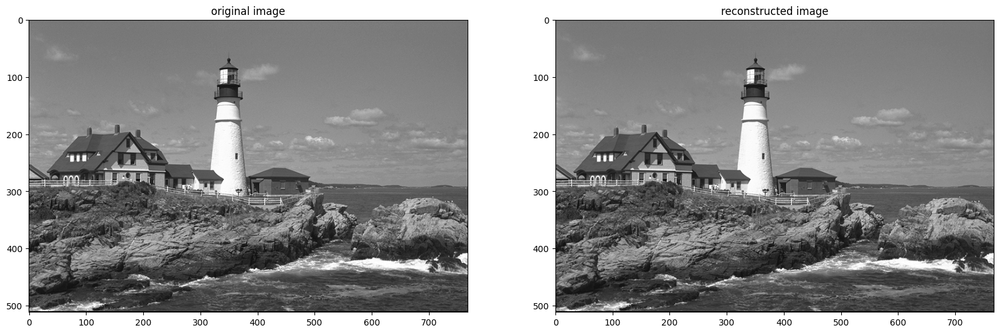

110.22343898908865
NNZ: 300402, total pixels: 0, ratio: 0.7639617919921875
n=1


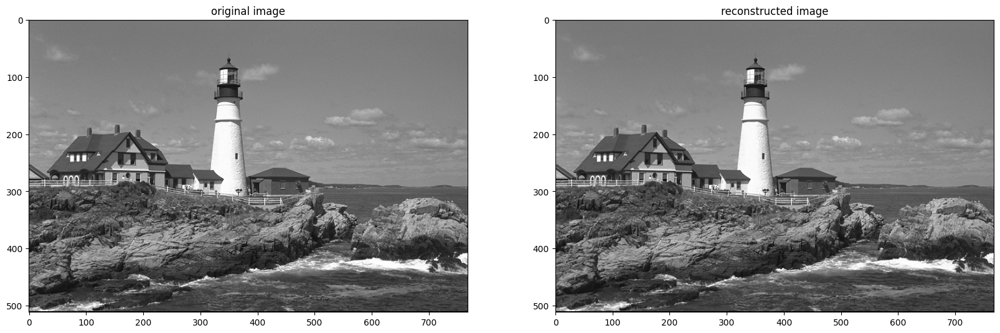

106.10798970943661
NNZ: 264793, total pixels: 0, ratio: 0.6734034220377604
n=2


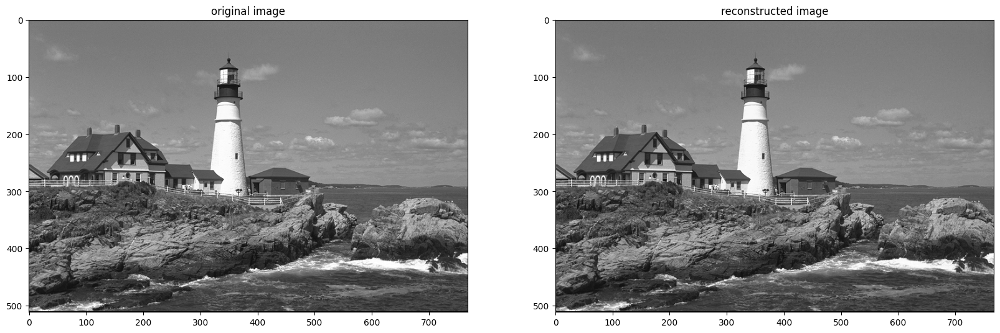

102.0660934811027
NNZ: 205865, total pixels: 0, ratio: 0.5235417683919271
n=3


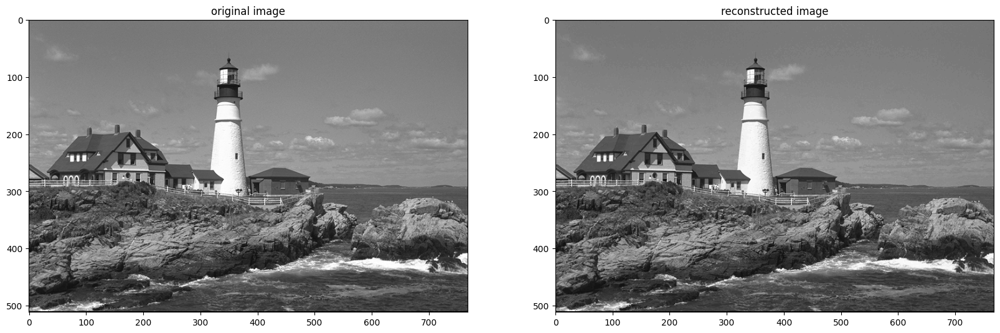

97.4079319537349
NNZ: 144677, total pixels: 0, ratio: 0.36793263753255206
n=4


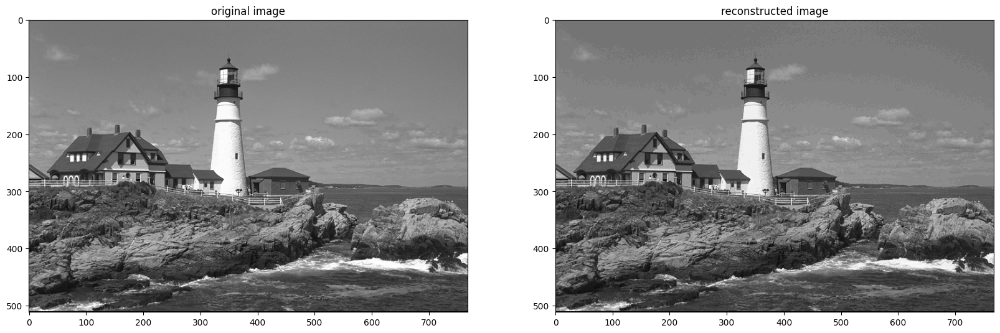

92.60866115955983
NNZ: 99000, total pixels: 0, ratio: 0.25177001953125
n=5


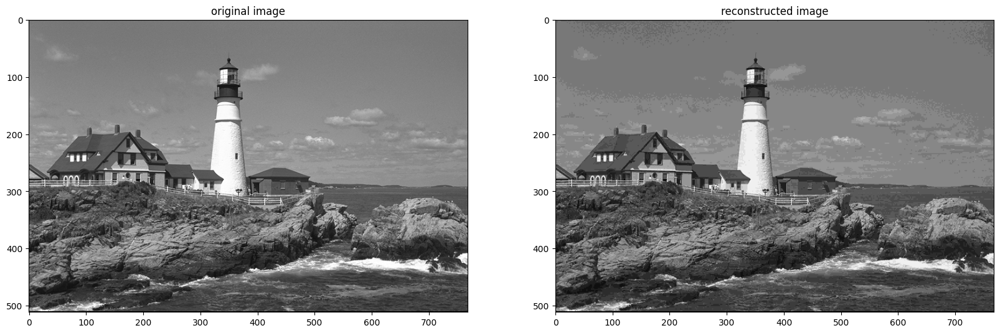

87.5118248930548
NNZ: 60047, total pixels: 0, ratio: 0.1527074178059896
n=6


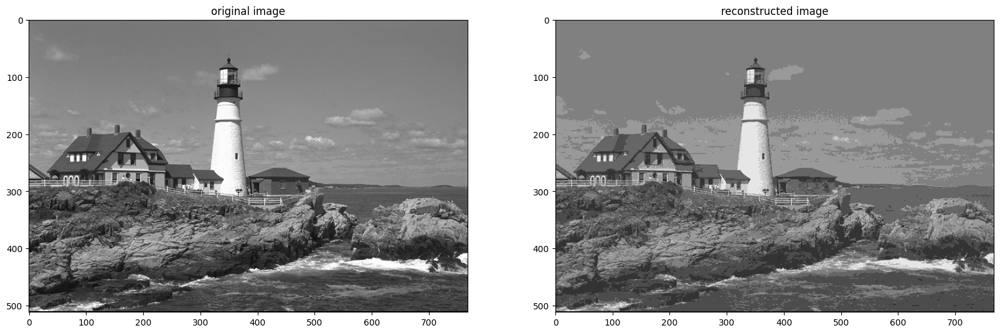

82.90982085346545
NNZ: 30444, total pixels: 0, ratio: 0.077423095703125
n=7


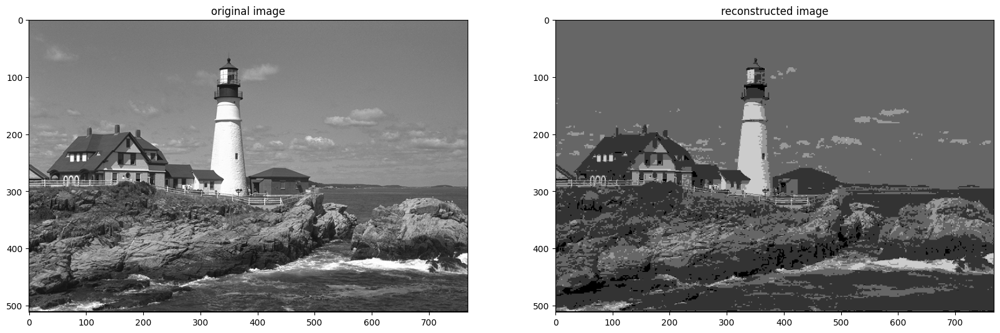

78.627728225676
NNZ: 14078, total pixels: 0, ratio: 0.035802205403645836
n=8


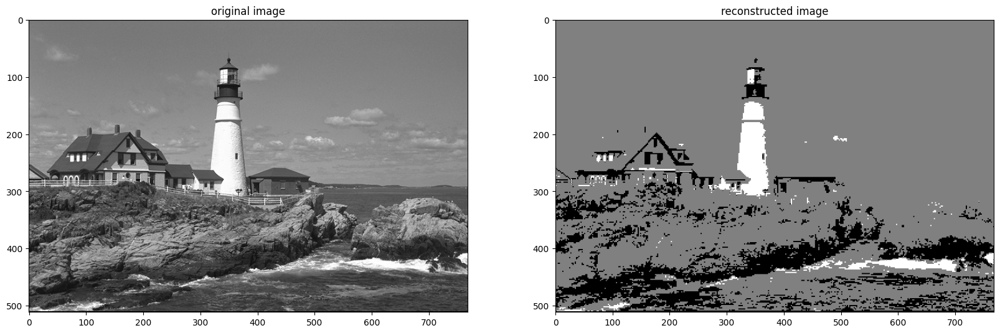

73.71818490941473
NNZ: 7787, total pixels: 0, ratio: 0.019803365071614582


In [201]:
img = cv2.imread('lighthouse.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
j = 3
n=4
results = [] # (j, n, psnr, nnz)
for n in range(9):
    print(f"n={n}")
    coeffs = wavelet_transform(img, j)
    for i in reversed(range(j)):
        coeffs[i] = (quantize_pyramid([coeffs[i][0]], q=2**n, miu=0)[0], tuple(quantize_pyramid(coeffs[i][1], q=2**n, miu=0), ))

    reconstructed_img = reconstruct_wavelet(coeffs)

    # show the original image and the reconstructed image
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.title("original image")
    plt.imshow(img, cmap='gray')
    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed_img, cmap='gray')
    plt.title("reconstructed image")
    plt.show()
    print(psnr(img, reconstructed_img))

    num_non_zero = 0
    total_pixels = 0
    cA = coeffs[-1][0]
    num_non_zero += np.sum(cA != 0)
    for cA, (cH, cV, cD) in coeffs:
        num_non_zero += np.sum(cH != 0)
        num_non_zero += np.sum(cV != 0)
        num_non_zero += np.sum(cD != 0)

    print(f"NNZ: {num_non_zero}, total pixels: {total_pixels}, ratio: {num_non_zero / original_num_pixels}")

When n equals to 4 or 5 the reconstruct image is near identical to the original image. In this case, the psnr is 0.36 or 0.25. Comparing the numbers, the wavelet transform is more efficient comparing to gaussian/laplacian transforme regarding image compression.